In [105]:
import pandas as pd 
import seaborn as sns

import numpy as np
import re
import matplotlib.pyplot as plt
import plotly.express as px

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler, MinMaxScaler 
from sklearn.feature_selection import VarianceThreshold 
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
!pip install xgboost
from xgboost import XGBClassifier
import xgboost as xgb
from sklearn.model_selection import RandomizedSearchCV
!pip install imbalanced-learn
from sklearn.model_selection import GridSearchCV
from imblearn.over_sampling import SMOTE
from collections import Counter
from sklearn.metrics import roc_auc_score, roc_curve, auc, precision_recall_curve
from sklearn.preprocessing import label_binarize

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


In [107]:
df = pd.read_csv("Data/train.csv")
df.head()

C:\Users\wwwna\AppData\Local\Temp\ipykernel_15996\3166244657.py:1: DtypeWarning:

Columns (26) have mixed types. Specify dtype option on import or set low_memory=False.



,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good


# Data Understanding

In [110]:
# Basic info
print('Dataset Shape', df.shape)
print(df.info())


Dataset Shape (100000, 28)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  object 
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  object 
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  object 
 13  Type_of_Loan      

In [112]:
#Display summary statistics for numeric columns
df.describe().T.style.background_gradient()


,count,mean,std,min,25%,50%,75%,max
Monthly_Inhand_Salary,84998.000000,4194.170850,3183.686167,303.645417,1625.568229,3093.745000,5957.448333,15204.633333
Num_Bank_Accounts,100000.000000,17.091280,117.404834,-1.000000,3.000000,6.000000,7.000000,1798.000000
Num_Credit_Card,100000.000000,22.474430,129.057410,0.000000,4.000000,5.000000,7.000000,1499.000000
Interest_Rate,100000.000000,72.466040,466.422621,1.000000,8.000000,13.000000,20.000000,5797.000000
Delay_from_due_date,100000.000000,21.068780,14.860104,-5.000000,10.000000,18.000000,28.000000,67.000000
Num_Credit_Inquiries,98035.000000,27.754251,193.177339,0.000000,3.000000,6.000000,9.000000,2597.000000
Credit_Utilization_Ratio,100000.000000,32.285173,5.116875,20.000000,28.052567,32.305784,36.496663,50.000000
Total_EMI_per_month,100000.000000,1403.118217,8306.041270,0.000000,30.306660,69.249473,161.224249,82331.000000


In [114]:
# Check for duplicate records (Insert after loading the dataset)
print(f"Number of duplicate rows: {df.duplicated().sum()}")

# Remove duplicates if any
df = df.drop_duplicates()


Number of duplicate rows: 0


# Data Cleaning

In [117]:
# Drop unnecessary columns
df.drop(columns=['ID', 'Customer_ID', 'Month', 'Name', 'SSN', 
                 'Type_of_Loan', 'Num_of_Delayed_Payment', 
                 'Amount_invested_monthly'], inplace=True)

In [119]:
# Function to check missing values
def missing_data(df):
    missing = df.isnull().sum()
    missing = missing[missing > 0]
    return missing.sort_values(ascending=False)

# Display missing values
missing_data(df)

Monthly_Inhand_Salary    15002
Credit_History_Age        9030
Num_Credit_Inquiries      1965
Monthly_Balance           1200
dtype: int64

In [121]:
# Sperating the Numerical and Categorical Columns 

num_cols = df.select_dtypes(include=['float','int64']).columns
cat_cols = df.select_dtypes(include=['object']).columns

print('Numeric Column: ',list(num_cols))
print('\nCategorical Column: ',list(cat_cols))

Numeric Column:  ['Monthly_Inhand_Salary', 'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate', 'Delay_from_due_date', 'Num_Credit_Inquiries', 'Credit_Utilization_Ratio', 'Total_EMI_per_month']

Categorical Column:  ['Age', 'Occupation', 'Annual_Income', 'Num_of_Loan', 'Changed_Credit_Limit', 'Credit_Mix', 'Outstanding_Debt', 'Credit_History_Age', 'Payment_of_Min_Amount', 'Payment_Behaviour', 'Monthly_Balance', 'Credit_Score']


In [123]:
# Check unique values for wrongly classified numerical columns

wrongly_categorical = ['Age', 'Annual_Income', 'Num_of_Loan',
                       'Changed_Credit_Limit', 'Outstanding_Debt', 'Credit_History_Age', 
                        'Monthly_Balance']

for col in wrongly_categorical:
    print(f"{col} unique values :\n",df[col].unique(),"\n")

Age unique values :
 ['23' '-500' '28_' ... '4808_' '2263' '1342'] 

Annual_Income unique values :
 ['19114.12' '34847.84' '34847.84_' ... '20002.88' '39628.99' '39628.99_'] 

Num_of_Loan unique values :
 ['4' '1' '3' '967' '-100' '0' '0_' '2' '3_' '2_' '7' '5' '5_' '6' '8' '8_'
 '9' '9_' '4_' '7_' '1_' '1464' '6_' '622' '352' '472' '1017' '945' '146'
 '563' '341' '444' '720' '1485' '49' '737' '1106' '466' '728' '313' '843'
 '597_' '617' '119' '663' '640' '92_' '1019' '501' '1302' '39' '716' '848'
 '931' '1214' '186' '424' '1001' '1110' '1152' '457' '1433' '1187' '52'
 '1480' '1047' '1035' '1347_' '33' '193' '699' '329' '1451' '484' '132'
 '649' '995' '545' '684' '1135' '1094' '1204' '654' '58' '348' '614'
 '1363' '323' '1406' '1348' '430' '153' '1461' '905' '1312' '1424' '1154'
 '95' '1353' '1228' '819' '1006' '795' '359' '1209' '590' '696' '1185_'
 '1465' '911' '1181' '70' '816' '1369' '143' '1416' '455' '55' '1096'
 '1474' '420' '1131' '904' '89' '1259' '527' '1241' '449' '983' '418

In [125]:
# Function to clean and convert numerical columns

def convert_numerical_columns(df, cols):
    def convert_credit_history(age):
        if pd.isnull(age):
            return np.nan
        years = re.search(r'(\d+) Years', str(age))
        months = re.search(r'(\d+) Months', str(age))
        years = int(years.group(1)) if years else 0
        months = int(months.group(1)) if months else 0
        return (years * 12) + months  

    df['Credit_History_Age'] = df['Credit_History_Age'].apply(convert_credit_history)

    df['Annual_Income'] = df['Annual_Income'].astype(str).str.replace(r"[^0-9.]", "", regex=True)
    df['Annual_Income'] = pd.to_numeric(df['Annual_Income'], errors='coerce')
    
    df['Monthly_Inhand_Salary'] = df['Monthly_Inhand_Salary'].fillna(df['Annual_Income'] / 12)

    for col in cols:
        df[col] = df[col].astype(str)
        df[col] = df[col].str.replace(r"[^0-9.]", "", regex=True)
        df[col] = pd.to_numeric(df[col], errors='coerce')

    return df

wrongly_categorical = ['Age', 'Annual_Income', 'Num_of_Loan', 'Changed_Credit_Limit', 
                       'Outstanding_Debt', 'Credit_History_Age', 'Monthly_Balance']

df = convert_numerical_columns(df, wrongly_categorical)
print(df.dtypes)
missing_data(df)


Age                           int64
Occupation                   object
Annual_Income               float64
Monthly_Inhand_Salary       float64
Num_Bank_Accounts             int64
Num_Credit_Card               int64
Interest_Rate                 int64
Num_of_Loan                   int64
Delay_from_due_date           int64
Changed_Credit_Limit        float64
Num_Credit_Inquiries        float64
Credit_Mix                   object
Outstanding_Debt            float64
Credit_Utilization_Ratio    float64
Credit_History_Age          float64
Payment_of_Min_Amount        object
Total_EMI_per_month         float64
Payment_Behaviour            object
Monthly_Balance             float64
Credit_Score                 object
dtype: object


Credit_History_Age      9030
Changed_Credit_Limit    2091
Num_Credit_Inquiries    1965
Monthly_Balance         1200
dtype: int64

In [126]:
# Filling missing values
df.loc[:, 'Credit_History_Age'] = df['Credit_History_Age'].fillna(df['Credit_History_Age'].median())
df.loc[:, 'Changed_Credit_Limit'] = df['Changed_Credit_Limit'].fillna(0)  # Assuming missing means no change
df.loc[:, 'Num_Credit_Inquiries'] = df['Num_Credit_Inquiries'].fillna(df['Num_Credit_Inquiries'].median())
df.loc[:, 'Monthly_Balance'] = df['Monthly_Balance'].fillna(df['Monthly_Balance'].median())

# Check again for missing values
missing_data(df)


Series([], dtype: int64)

In [129]:
# Remove outliers based on IQR
def remove_outliers(df, columns):
    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
    return df

numerical_cols = ['Annual_Income', 'Outstanding_Debt', 'Monthly_Balance']
df = remove_outliers(df, numerical_cols)


# Exploratory Data Analysis

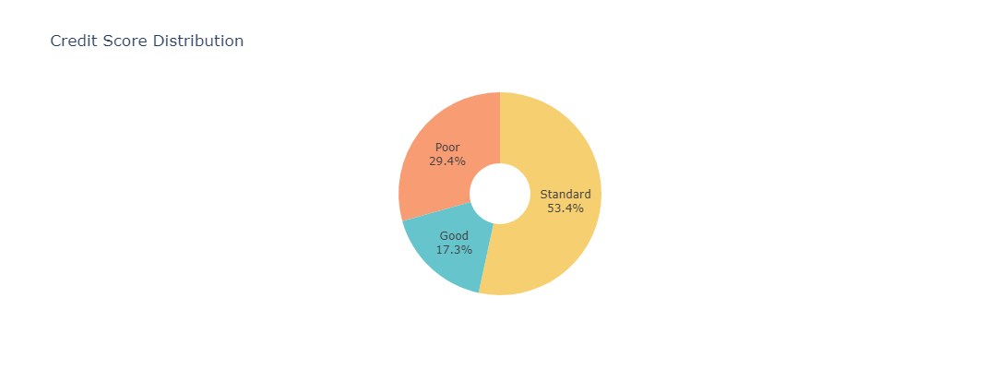

In [132]:
fig = px.pie(df, names='Credit_Score', color='Credit_Score',hole=.3,
       color_discrete_sequence=px.colors.qualitative.Pastel,
       width=800, height=400, title="Credit Score Distribution")
fig.update_traces(textposition='inside', textinfo='percent+label', showlegend=False)

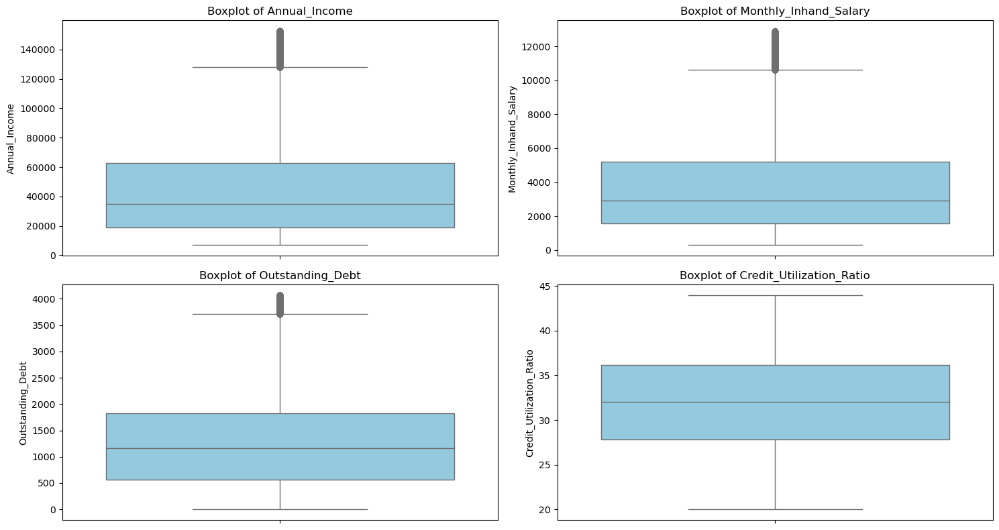

In [134]:
# Boxplots for Key Financial Attributes
plt.figure(figsize=(15, 8))

financial_features = ['Annual_Income', 'Monthly_Inhand_Salary', 'Outstanding_Debt', 'Credit_Utilization_Ratio']

for i, col in enumerate(financial_features, 1):
    plt.subplot(2, 2, i)
    sns.boxplot(y=df[col], color='skyblue')
    plt.title(f'Boxplot of {col}')
    plt.ylabel(col)

plt.tight_layout()
plt.show()


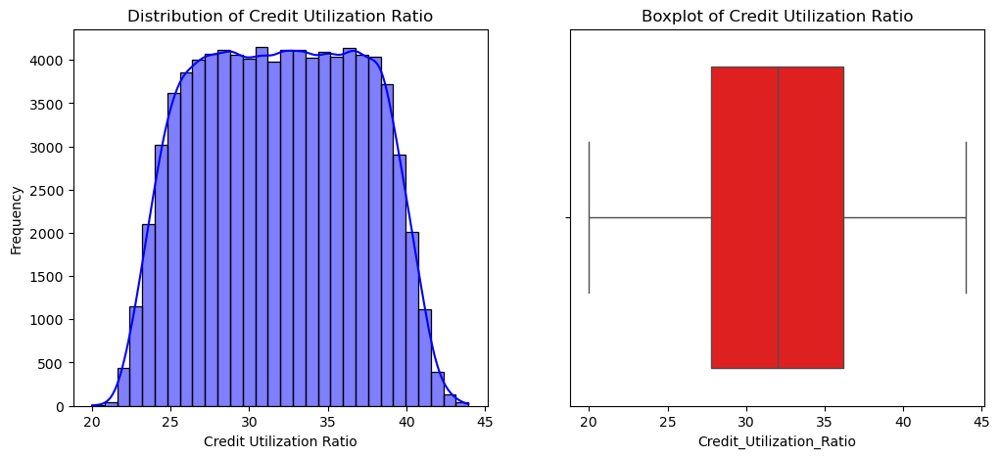

In [17]:


plt.figure(figsize=(12, 5))

# Histogram
plt.subplot(1, 2, 1)
sns.histplot(df['Credit_Utilization_Ratio'], bins=30, kde=True, color='blue')
plt.title('Distribution of Credit Utilization Ratio')
plt.xlabel('Credit Utilization Ratio')
plt.ylabel('Frequency')

# Boxplot
plt.subplot(1, 2, 2)
sns.boxplot(x=df['Credit_Utilization_Ratio'], color='red')
plt.title('Boxplot of Credit Utilization Ratio')

plt.show()


# Feature Engineering

In [19]:
# Identify categorical columns
categorical_columns = df.select_dtypes(include=['object']).columns
print("Categorical Columns:", categorical_columns)


Categorical Columns: Index(['Occupation', 'Credit_Mix', 'Payment_of_Min_Amount',
       'Payment_Behaviour', 'Credit_Score'],
      dtype='object')


In [20]:
# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Apply Label Encoding where it makes sense
for col in ['Credit_Mix', 'Payment_of_Min_Amount', 'Credit_Score']:
    df[col] = label_encoder.fit_transform(df[col])

# Apply One-Hot Encoding for categorical columns with many unique values
df = pd.get_dummies(df, columns=['Occupation', 'Payment_Behaviour'], drop_first=True)

# Display first few rows
df.head()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Changed_Credit_Limit,Num_Credit_Inquiries,...,Occupation_Scientist,Occupation_Teacher,Occupation_Writer,Occupation________,Payment_Behaviour_High_spent_Large_value_payments,Payment_Behaviour_High_spent_Medium_value_payments,Payment_Behaviour_High_spent_Small_value_payments,Payment_Behaviour_Low_spent_Large_value_payments,Payment_Behaviour_Low_spent_Medium_value_payments,Payment_Behaviour_Low_spent_Small_value_payments
0,23,19114.12,1824.843333,3,4,3,4,3,11.27,4.0,...,True,False,False,False,False,False,True,False,False,False
1,23,19114.12,1592.843333,3,4,3,4,-1,11.27,4.0,...,True,False,False,False,False,False,False,True,False,False
2,500,19114.12,1592.843333,3,4,3,4,3,0.00,4.0,...,True,False,False,False,False,False,False,False,True,False
3,23,19114.12,1592.843333,3,4,3,4,5,6.27,4.0,...,True,False,False,False,False,False,False,False,False,True
4,23,19114.12,1824.843333,3,4,3,4,6,11.27,4.0,...,True,False,False,False,False,True,False,False,False,False


# Feature Selection

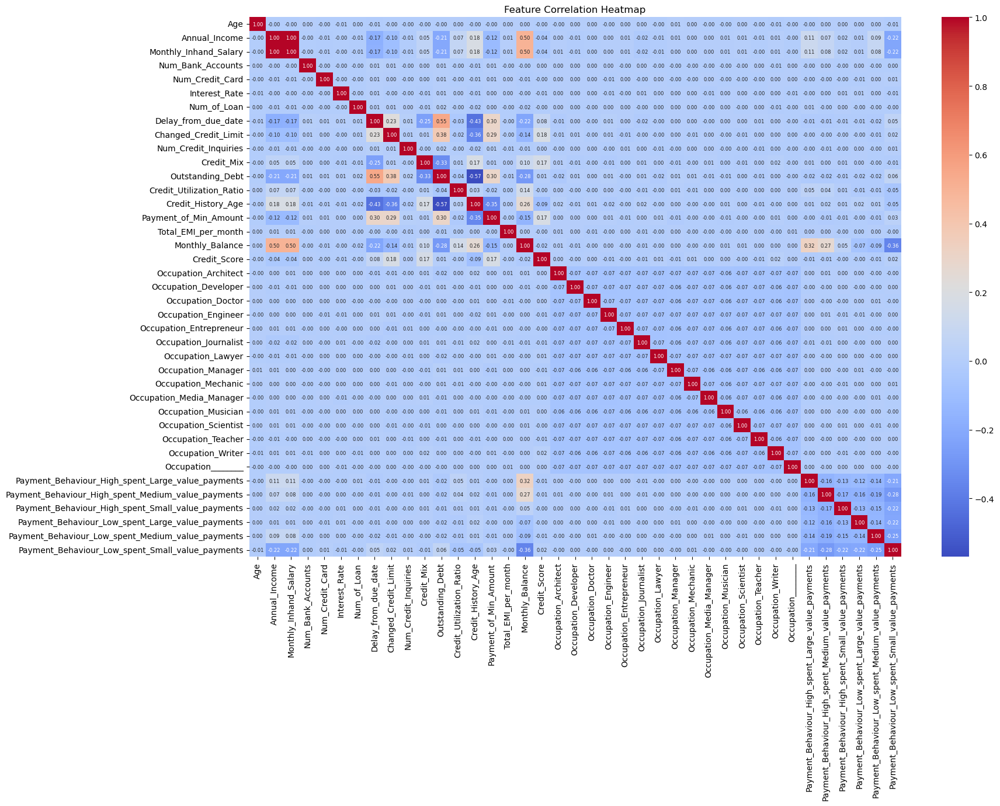

In [22]:
plt.figure(figsize=(18, 12))
sns.heatmap(df.corr(), annot=True, fmt='.2f', cmap='coolwarm', annot_kws={"size": 6})  # Reduce font size
plt.xticks(rotation=90)  # Rotate x-axis labels
plt.yticks(rotation=0)  # Keep y-axis labels straight
plt.title("Feature Correlation Heatmap")
plt.show()


In [23]:
# Select only numerical features
num_features = df.select_dtypes(include=['number'])

# Apply VarianceThreshold (removing features with variance < 0.01)
selector = VarianceThreshold(threshold=0.01)
selected_features = selector.fit_transform(num_features)

# Get remaining feature names
remaining_features = num_features.columns[selector.get_support()]
print("Selected Features:", remaining_features)


Selected Features: Index(['Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Delay_from_due_date', 'Changed_Credit_Limit', 'Num_Credit_Inquiries',
       'Credit_Mix', 'Outstanding_Debt', 'Credit_Utilization_Ratio',
       'Credit_History_Age', 'Payment_of_Min_Amount', 'Total_EMI_per_month',
       'Monthly_Balance', 'Credit_Score'],
      dtype='object')


                     Feature  Importance
11          Outstanding_Debt    0.127020
5              Interest_Rate    0.094874
13        Credit_History_Age    0.077249
10                Credit_Mix    0.072733
7        Delay_from_due_date    0.070645
8       Changed_Credit_Limit    0.062519
16           Monthly_Balance    0.061957
12  Credit_Utilization_Ratio    0.060576
2      Monthly_Inhand_Salary    0.050543
9       Num_Credit_Inquiries    0.049044
15       Total_EMI_per_month    0.047543
1              Annual_Income    0.047375
4            Num_Credit_Card    0.045089
0                        Age    0.044458
3          Num_Bank_Accounts    0.036308
14     Payment_of_Min_Amount    0.026672
6                Num_of_Loan    0.025396


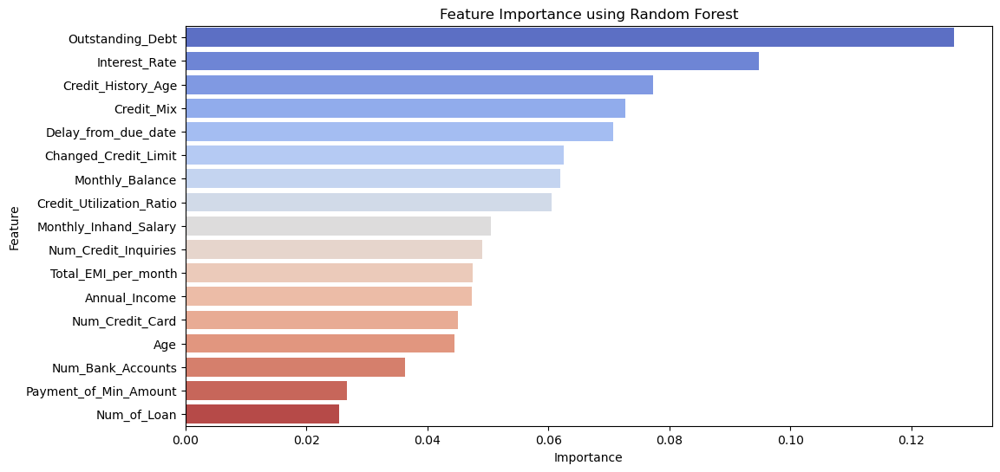

In [99]:
# Selecting only numerical features
X = df[remaining_features].drop(columns=['Credit_Score'], errors='ignore')  # Avoid errors if Credit_Score is missing
y = df['Credit_Score']  # Target variable

# Ensure no missing values
X = X.fillna(0)

# Train a simple Random Forest model
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X, y)

# Get feature importances
importances = pd.DataFrame({'Feature': X.columns, 'Importance': rf.feature_importances_})
importances = importances.sort_values(by='Importance', ascending=False)

# Display feature importances
print(importances)

# Plot the feature importances

plt.figure(figsize=(12, 6))
sns.barplot(x='Importance', y='Feature', data=importances, hue="Feature", palette='coolwarm')
plt.title("Feature Importance using Random Forest")
plt.show()


In [25]:
# List of least important features to drop
drop_features = ['Age', 'Num_Credit_Card', 'Num_Bank_Accounts', 'Payment_of_Min_Amount', 'Num_of_Loan']

# Drop the features
df_selected = df.drop(columns=drop_features)

# Display updated feature set
print("Updated Dataset Shape:", df_selected.shape)
df_selected.head()


Updated Dataset Shape: (85519, 34)


,Annual_Income,Monthly_Inhand_Salary,Interest_Rate,Delay_from_due_date,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,...,Occupation_Scientist,Occupation_Teacher,Occupation_Writer,Occupation________,Payment_Behaviour_High_spent_Large_value_payments,Payment_Behaviour_High_spent_Medium_value_payments,Payment_Behaviour_High_spent_Small_value_payments,Payment_Behaviour_Low_spent_Large_value_payments,Payment_Behaviour_Low_spent_Medium_value_payments,Payment_Behaviour_Low_spent_Small_value_payments
0,19114.12,1824.843333,3,3,11.27,4.0,3,809.98,26.822620,265.0,...,True,False,False,False,False,False,True,False,False,False
1,19114.12,1592.843333,3,-1,11.27,4.0,1,809.98,31.944960,219.0,...,True,False,False,False,False,False,False,True,False,False
2,19114.12,1592.843333,3,3,0.00,4.0,1,809.98,28.609352,267.0,...,True,False,False,False,False,False,False,False,True,False
3,19114.12,1592.843333,3,5,6.27,4.0,1,809.98,31.377862,268.0,...,True,False,False,False,False,False,False,False,False,True
4,19114.12,1824.843333,3,6,11.27,4.0,1,809.98,24.797347,269.0,...,True,False,False,False,False,True,False,False,False,False


In [26]:
# Scaling the features 
numerical_features = [
    'Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
    'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan', 'Delay_from_due_date',
    'Changed_Credit_Limit', 'Num_Credit_Inquiries', 'Outstanding_Debt',
    'Credit_Utilization_Ratio', 'Credit_History_Age', 'Total_EMI_per_month',
    'Monthly_Balance'
]

scaler = StandardScaler()
df[numerical_features] = scaler.fit_transform(df[numerical_features])

df[numerical_features].head()


,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Monthly_Balance
0,-0.140910,-0.804901,-0.712646,-0.120427,-0.143139,-0.149341,-0.109738,-1.229415,0.189877,-0.121525,-0.528612,-1.033865,0.462443,-0.161977,-0.333858
1,-0.140910,-0.804901,-0.802909,-0.120427,-0.143139,-0.149341,-0.109738,-1.504180,0.189877,-0.121525,-0.528612,-0.008664,-0.034421,-0.161977,-0.534297
2,0.556956,-0.804901,-0.802909,-0.120427,-0.143139,-0.149341,-0.109738,-1.229415,-1.555764,-0.121525,-0.528612,-0.676263,0.484046,-0.161977,-0.199230
3,-0.140910,-0.804901,-0.802909,-0.120427,-0.143139,-0.149341,-0.109738,-1.092032,-0.584587,-0.121525,-0.528612,-0.122165,0.494847,-0.161977,-0.974365
4,-0.140910,-0.804901,-0.712646,-0.120427,-0.143139,-0.149341,-0.109738,-1.023341,0.189877,-0.121525,-0.528612,-1.439210,0.505648,-0.161977,-0.125288


# Train-Test Split

In [28]:
# Define input features (X) and target variable (y)
X = df.drop(columns=['Credit_Score'])  # Remove the target variable
y = df['Credit_Score']  # Target variable

# Split the dataset (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Print dataset shapes
print("Training Set Shape:", X_train.shape, y_train.shape)
print("Testing Set Shape:", X_test.shape, y_test.shape)

Training Set Shape: (68415, 38) (68415,)
Testing Set Shape: (17104, 38) (17104,)


# Model Selection

✅ Model Accuracy Random Forest: 0.8007

📊 Classification Report:
               precision    recall  f1-score   support

           0       0.75      0.71      0.73      2952
           1       0.80      0.82      0.81      5020
           2       0.82      0.82      0.82      9132

    accuracy                           0.80     17104
   macro avg       0.79      0.78      0.79     17104
weighted avg       0.80      0.80      0.80     17104



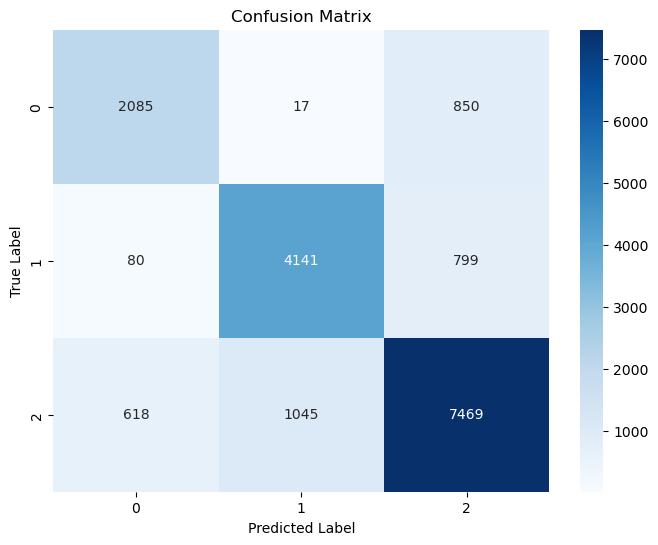

In [30]:
# Initialize the model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the model on the training data
rf_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_model.predict(X_test)

# Evaluate model performance
accuracy = accuracy_score(y_test, y_pred)
print(f"✅ Model Accuracy Random Forest: {accuracy:.4f}\n")

# Print classification report
print("📊 Classification Report:\n", classification_report(y_test, y_pred))

# Compute confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Blues", xticklabels=rf_model.classes_, yticklabels=rf_model.classes_)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()


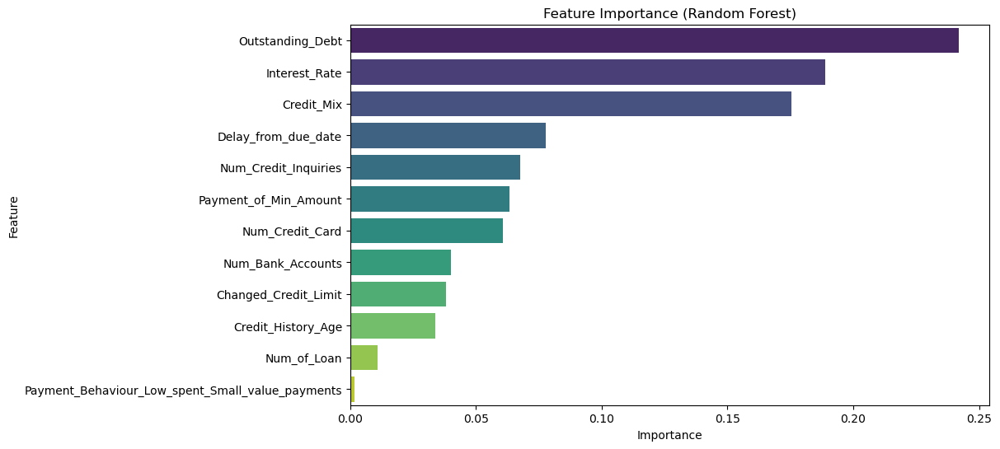

In [97]:
# Get feature importance
importances = rf_model.feature_importances_
features = X_train.columns

# Sort feature importance values
feature_importance = sorted(zip(importances, features), reverse=True)
importance_df = pd.DataFrame(feature_importance, columns=['Importance', 'Feature'])

# Plot feature importance
plt.figure(figsize=(10, 6))
sns.barplot(x="Importance", y="Feature", data=importance_df, hue="Feature", legend=False, palette="viridis")
plt.title("Feature Importance (Random Forest)")
plt.show()


Model Accuracy: 0.7748

Classification Report:
               precision    recall  f1-score   support

           0       0.71      0.70      0.71      2952
           1       0.77      0.76      0.77      5020
           2       0.80      0.80      0.80      9132

    accuracy                           0.77     17104
   macro avg       0.76      0.76      0.76     17104
weighted avg       0.77      0.77      0.77     17104



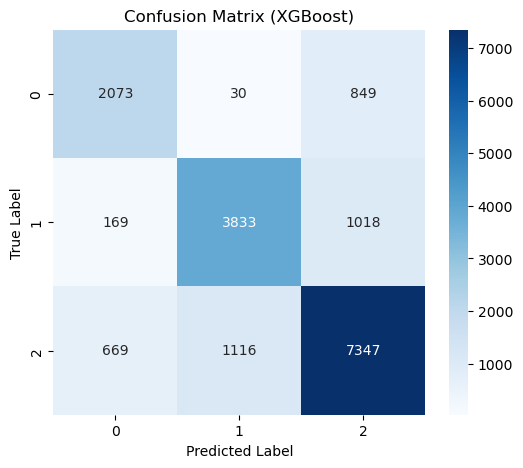

In [32]:
# Initialize and train XGBoost model
xgb_model = XGBClassifier(eval_metric='mlogloss')
xgb_model.fit(X_train, y_train)

# Predictions
y_pred_xgb = xgb_model.predict(X_test)

# Model Evaluation
accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
print(f"Model Accuracy: {accuracy_xgb:.4f}")
print("\nClassification Report:\n", classification_report(y_test, y_pred_xgb))

# Confusion Matrix
conf_matrix_xgb = confusion_matrix(y_test, y_pred_xgb)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix_xgb, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix (XGBoost)")
plt.show()


# Balance the Class 

In [34]:
# Initialize SMOTE
smote = SMOTE(random_state=42)

# Resample the dataset
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

# Check new class distribution
print("Before SMOTE:", Counter(y_train))
print("After SMOTE:", Counter(y_resampled))


Before SMOTE: Counter({2: 36525, 1: 20081, 0: 11809})
After SMOTE: Counter({2: 36525, 1: 36525, 0: 36525})


In [35]:
# Train Random Forest on balanced data
rf_balanced = RandomForestClassifier(n_estimators=200, min_samples_split=5, 
                                     min_samples_leaf=2, max_features='log2', 
                                     max_depth=None, random_state=42)
rf_balanced.fit(X_resampled, y_resampled)

# Train XGBoost on balanced data
xgb_balanced = XGBClassifier(subsample=1.0, n_estimators=200, max_depth=8, 
                             learning_rate=0.1, gamma=1, colsample_bytree=0.7, 
                             random_state=42)
xgb_balanced.fit(X_resampled, y_resampled)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.7, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=1, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=200, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [36]:

# Predictions
rf_preds = rf_balanced.predict(X_test)
xgb_preds = xgb_balanced.predict(X_test)

# Random Forest Metrics
print("Random Forest After SMOTE:")
print(classification_report(y_test, rf_preds))
print(confusion_matrix(y_test, rf_preds))

# XGBoost Metrics
print("XGBoost After SMOTE:")
print(classification_report(y_test, xgb_preds))
print(confusion_matrix(y_test, xgb_preds))


Random Forest After SMOTE:
              precision    recall  f1-score   support

           0       0.69      0.79      0.74      2952
           1       0.78      0.84      0.81      5020
           2       0.85      0.77      0.81      9132

    accuracy                           0.80     17104
   macro avg       0.77      0.80      0.79     17104
weighted avg       0.80      0.80      0.80     17104

[[2335   16  601]
 [ 174 4222  624]
 [ 883 1182 7067]]
XGBoost After SMOTE:
              precision    recall  f1-score   support

           0       0.67      0.73      0.70      2952
           1       0.76      0.77      0.77      5020
           2       0.81      0.78      0.80      9132

    accuracy                           0.77     17104
   macro avg       0.75      0.76      0.75     17104
weighted avg       0.77      0.77      0.77     17104

[[2156   36  760]
 [ 243 3883  894]
 [ 817 1187 7128]]


In [37]:
# Convert y_test to one-vs-rest format (binarization)
y_test_bin = label_binarize(y_test, classes=[0, 1, 2])

AUC-ROC for Random-Forest

Random Forest AUC-ROC Score: 0.9176


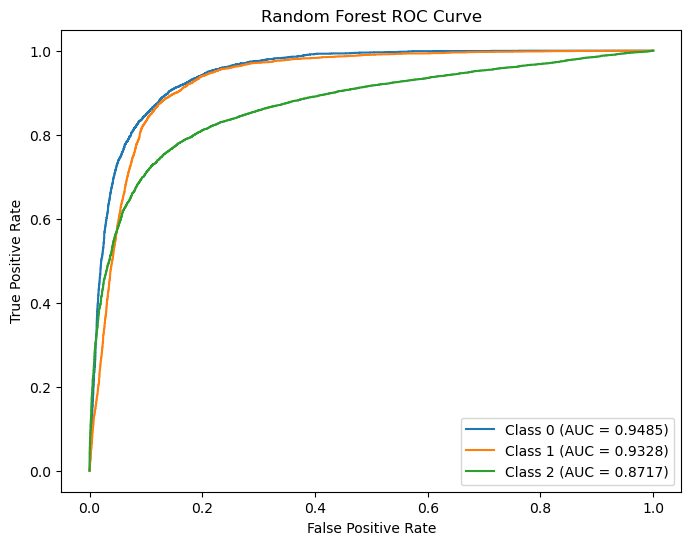

In [39]:
# Predict probabilities for each class
rf_probs = rf_balanced.predict_proba(X_test)

# Compute AUC-ROC scores for each class
rf_auc = roc_auc_score(y_test_bin, rf_probs, multi_class="ovr")
print(f"Random Forest AUC-ROC Score: {rf_auc:.4f}")

# Plot ROC Curve for Random Forest
plt.figure(figsize=(8, 6))
for i, label in enumerate([0, 1, 2]):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], rf_probs[:, i])
    plt.plot(fpr, tpr, label=f'Class {label} (AUC = {roc_auc_score(y_test_bin[:, i], rf_probs[:, i]):.4f})')

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Random Forest ROC Curve")
plt.legend()
plt.show()

AUC-ROC for XGBoost

XGBoost AUC-ROC Score: 0.8984


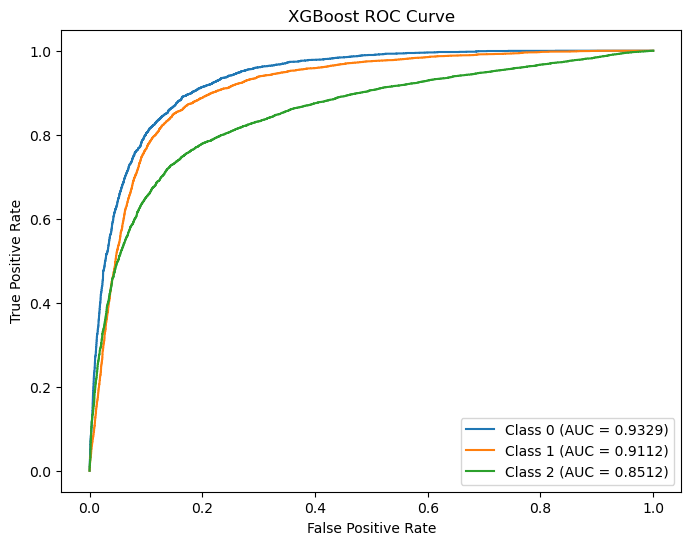

In [41]:
# Predict probabilities for each class
xgb_probs = xgb_balanced.predict_proba(X_test)

# Compute AUC-ROC scores for each class
xgb_auc = roc_auc_score(y_test_bin, xgb_probs, multi_class="ovr")
print(f"XGBoost AUC-ROC Score: {xgb_auc:.4f}")

# Plot ROC Curve for XGBoost
plt.figure(figsize=(8, 6))
for i, label in enumerate([0, 1, 2]):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], xgb_probs[:, i])
    plt.plot(fpr, tpr, label=f'Class {label} (AUC = {roc_auc_score(y_test_bin[:, i], xgb_probs[:, i]):.4f})')

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("XGBoost ROC Curve")
plt.legend()
plt.show()

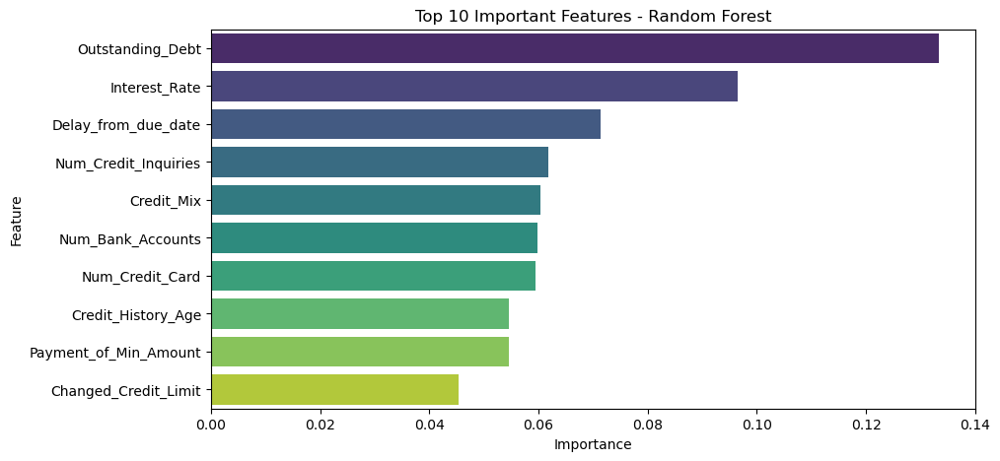

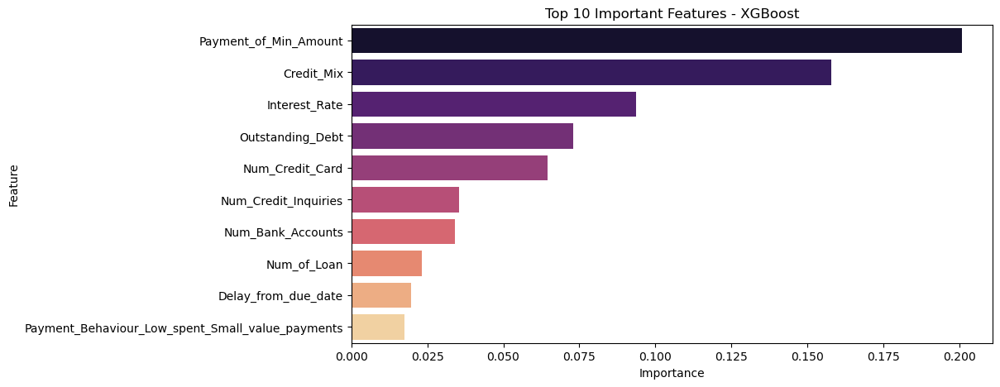

In [42]:

# Get feature importance from Random Forest
rf_feature_importance = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': rf_balanced.feature_importances_
}).sort_values(by="Importance", ascending=False)

# Get feature importance from XGBoost
xgb_feature_importance = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': xgb_balanced.feature_importances_
}).sort_values(by="Importance", ascending=False)

# Plot feature importance for Random Forest
plt.figure(figsize=(10, 5))
sns.barplot(x=rf_feature_importance["Importance"][:10], 
            y=rf_feature_importance["Feature"][:10], 
            hue=rf_feature_importance["Feature"][:10],palette="viridis",legend=False)
plt.title("Top 10 Important Features - Random Forest")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.show()

# Plot feature importance for XGBoost
plt.figure(figsize=(10, 5))
sns.barplot(x=xgb_feature_importance["Importance"][:10], 
            y=xgb_feature_importance["Feature"][:10], 
            hue=xgb_feature_importance["Feature"][:10], 
            palette="magma",
            legend=False)
plt.title("Top 10 Important Features - XGBoost")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.show()


In [43]:
# List of selected features
selected_features = [
    "Outstanding_Debt", "Interest_Rate", "Credit_Mix", "Payment_of_Min_Amount",
    "Num_Credit_Inquiries", "Num_Credit_Card", "Num_Bank_Accounts",
    "Delay_from_due_date", "Credit_History_Age", "Num_of_Loan",
    "Changed_Credit_Limit", "Payment_Behaviour_Low_spent_Small_value_payments"
]

# Keep only selected features along with the target variable
df_selected = df[selected_features + ["Credit_Score"]]

# Splitting data into train and test sets
from sklearn.model_selection import train_test_split

X = df_selected.drop(columns=["Credit_Score"])
y = df_selected["Credit_Score"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Display shape of new dataset
print("Updated training data shape:", X_train.shape)
print("Updated testing data shape:", X_test.shape)


Updated training data shape: (68415, 12)
Updated testing data shape: (17104, 12)


In [44]:
# Initialize and train Random Forest
rf_model = RandomForestClassifier(n_estimators=200, max_depth=8, random_state=42)
rf_model.fit(X_train, y_train)

# Predictions
y_pred_rf = rf_model.predict(X_test)

# Evaluation
print("Random Forest After Feature Selection:")
print(classification_report(y_test, y_pred_rf))
print("Accuracy:", accuracy_score(y_test, y_pred_rf))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_rf))

Random Forest After Feature Selection:
              precision    recall  f1-score   support

           0       0.58      0.66      0.62      2952
           1       0.75      0.70      0.72      5020
           2       0.77      0.76      0.77      9132

    accuracy                           0.73     17104
   macro avg       0.70      0.71      0.70     17104
weighted avg       0.73      0.73      0.73     17104

Accuracy: 0.7259705332086062
Confusion Matrix:
 [[1962   41  949]
 [ 389 3492 1139]
 [1053 1116 6963]]


In [45]:
# Initialize and train XGBoost
# Initialize and train XGBoost
xgb_model = XGBClassifier(n_estimators=200, max_depth=8, learning_rate=0.1, gamma=1, colsample_bytree=0.7, random_state=42)
xgb_model.fit(X_train, y_train)

# Predictions
y_pred_xgb = xgb_model.predict(X_test)

# Evaluation
print("XGBoost After Feature Selection:")
print(classification_report(y_test, y_pred_xgb))
print("Accuracy:", accuracy_score(y_test, y_pred_xgb))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_xgb))

XGBoost After Feature Selection:
              precision    recall  f1-score   support

           0       0.64      0.67      0.65      2952
           1       0.76      0.74      0.75      5020
           2       0.79      0.79      0.79      9132

    accuracy                           0.75     17104
   macro avg       0.73      0.73      0.73     17104
weighted avg       0.75      0.75      0.75     17104

Accuracy: 0.7530402245088869
Confusion Matrix:
 [[1974   45  933]
 [ 274 3717 1029]
 [ 833 1110 7189]]


Random Forest AUC-ROC Score: 0.8623292921500477


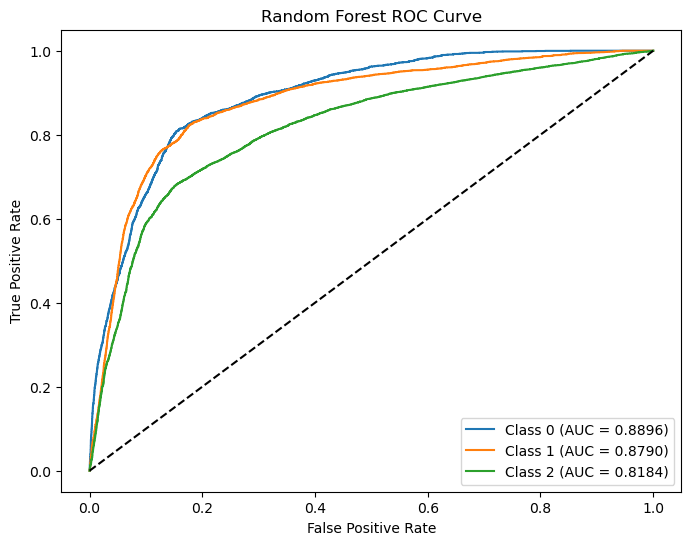

XGBoost AUC-ROC Score: 0.885401679208976


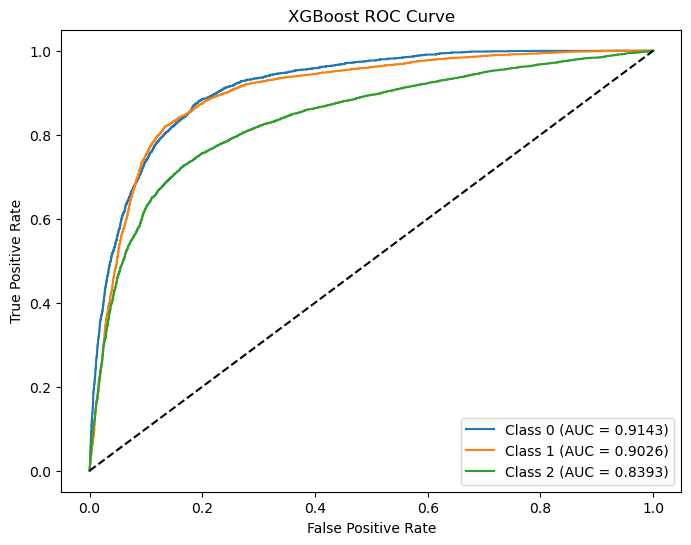

In [46]:

# Function to plot ROC Curve for multi-class classification
def plot_roc_curve(model, X_test, y_test, title):
    y_prob = model.predict_proba(X_test)  # Get probability predictions
    n_classes = len(np.unique(y_test))  # Number of classes
    
    plt.figure(figsize=(8, 6))
    for i in range(n_classes):
        fpr, tpr, _ = roc_curve(y_test == i, y_prob[:, i])
        auc_score = roc_auc_score(y_test == i, y_prob[:, i])
        plt.plot(fpr, tpr, label=f"Class {i} (AUC = {auc_score:.4f})")

    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(title)
    plt.legend()
    plt.show()

# Evaluate AUC-ROC for Random Forest
print("Random Forest AUC-ROC Score:", roc_auc_score(y_test, rf_model.predict_proba(X_test), multi_class="ovr"))
plot_roc_curve(rf_model, X_test, y_test, "Random Forest ROC Curve")

# Evaluate AUC-ROC for XGBoost
print("XGBoost AUC-ROC Score:", roc_auc_score(y_test, xgb_model.predict_proba(X_test), multi_class="ovr"))
plot_roc_curve(xgb_model, X_test, y_test, "XGBoost ROC Curve")


In [101]:

# Define parameter grid
param_grid = {
    'n_estimators': [100, 200],'max_depth': [3, 5], 'learning_rate': [0.01, 0.1], 'subsample': [0.8], 'colsample_bytree': [0.8], 'gamma': [0, 0.1] 
}


# Initialize model
xgb_model = xgb.XGBClassifier(objective='multi:softprob', eval_metric='mlogloss')

# Grid Search with 5-Fold Cross Validation
grid_search = GridSearchCV(xgb_model, param_grid, scoring='accuracy', cv=5, verbose=1, n_jobs=-1)

# Fit GridSearch to Data
grid_search.fit(X_train, y_train)

# Best Parameters
print("Best Parameters:", grid_search.best_params_)

# Evaluate on Test Data
best_xgb = grid_search.best_estimator_
y_pred = best_xgb.predict(X_test)

# Print Classification Report
print(classification_report(y_test, y_pred))


Fitting 5 folds for each of 16 candidates, totalling 80 fits
Best Parameters: {'colsample_bytree': 0.8, 'gamma': 0, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8}
              precision    recall  f1-score   support

           0       0.63      0.65      0.64      2952
           1       0.75      0.72      0.74      5020
           2       0.78      0.79      0.78      9132

    accuracy                           0.74     17104
   macro avg       0.72      0.72      0.72     17104
weighted avg       0.74      0.74      0.74     17104



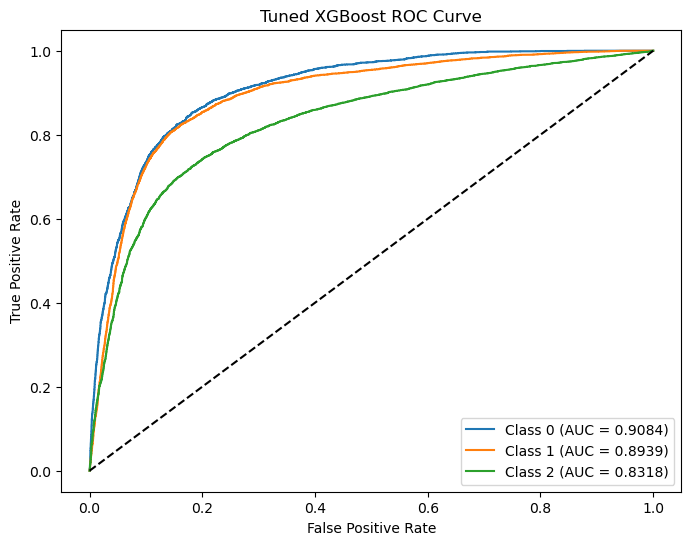

In [48]:

# Predict probabilities
best_xgb_model = grid_search.best_estimator_
y_probs = best_xgb_model.predict_proba(X_test)

# Plot ROC curves for each class
plt.figure(figsize=(8, 6))
for i in range(3):  # 3 classes (0, 1, 2)
    fpr, tpr, _ = roc_curve(y_test == i, y_probs[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Class {i} (AUC = {roc_auc:.4f})')

plt.plot([0, 1], [0, 1], 'k--')  # Random guessing line
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Tuned XGBoost ROC Curve')
plt.legend(loc='lower right')
plt.show()


C:\Users\wwwna\AppData\Local\Temp\ipykernel_15996\244713789.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




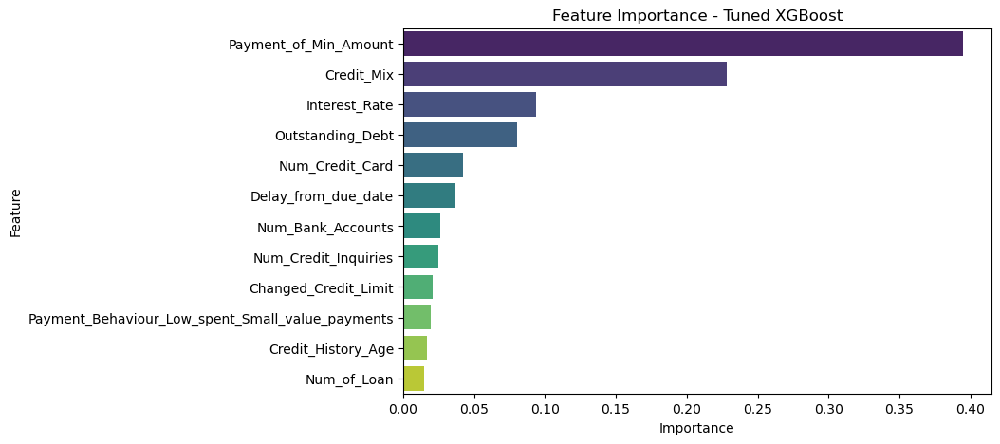

In [49]:

# Get feature importance
feature_importances = best_xgb_model.feature_importances_
feature_names = X_train.columns

# Sort features by importance
sorted_idx = np.argsort(feature_importances)[::-1]
sorted_importances = feature_importances[sorted_idx]
sorted_features = feature_names[sorted_idx]

# Plot
plt.figure(figsize=(8, 5))
sns.barplot(x=sorted_importances, y=sorted_features, palette="viridis")
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance - Tuned XGBoost')
plt.show()


# Save the Final Tuned XGBoost Model

In [51]:
import joblib

# Save the model
joblib.dump(grid_search.best_estimator_, "final_xgboost_model.pkl")

print("Model saved successfully!")


Model saved successfully!


In [52]:
# Load the model
loaded_model = joblib.load("final_xgboost_model.pkl")

# Make predictions using the loaded model
predictions = loaded_model.predict(X_test)
